In [55]:
import os
import torch
import math
import torch.nn as nn
from torch.utils.data import Dataset
import numpy as np
import json
import cv2
import re
import random
import torchvision.transforms as transforms
from torchvision.io import read_image

import matplotlib.pyplot as plt
import torchvision.transforms as T


class PanopticDataset(Dataset):
    def __init__(self, transform):

        self.data_path = "../../dataset/Panoptic/ProcessedPanopticDataset/"
#         self.data_path = '/media/mmlab/Volume/Panoptic/ProcessedPanopticDataset/'
        self.training_dir = []
        
        self.transform = transform
        
        paths = []

        motion_seq = os.listdir(self.data_path)
        no_dir = ['scripts','python','matlab','.git','glViewer.py','README.md','matlab',
                'README_kinoptic.md', '171204_pose3']
    
        for dir in motion_seq:
            if dir not in no_dir:
                if 'haggling' in dir:
                    continue
                elif dir == '171204_pose2' or dir =='171204_pose5' or dir =='171026_cello3':
                    if os.path.exists(os.path.join(self.data_path,dir,'hdJoints')):
                        data_path = os.path.join(self.data_path,dir,'hdJoints')
                        for lists in (os.listdir(data_path)):
                            paths.append(os.path.join(data_path,lists.split('.json')[0]))
                elif 'ian' in dir:
                    continue
                else:
                    if os.path.exists(os.path.join(self.data_path,dir,'hdJoints')):
                        data_path = os.path.join(self.data_path,dir,'hdJoints')
                        for lists in (os.listdir(data_path)):
                            paths.append(os.path.join(data_path,lists.split('.json')[0]))

        self.data = {'paths': paths}

    def __len__(self):
        return len(self.data['paths'])
    
    def get_second_view(self, image_path):
        """Randomly gets another camera view"""
        split = image_path.split(';')
        camera = split[1].split('_')
        view = int(camera[-1])
        
        second_view = random.randint(0, view) if view > 15 else random.randint(view + 1, 30)
        
        camera[2] = str(second_view) if second_view > 9 else '0' + str(second_view)
        camera = '_'.join(camera)
        split[1] = camera
        second_path = ';'.join(split)
        
        return second_path


    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        sample = dict()

        path_split = self.data['paths'][idx].split('/hdJoints')
        image1_path = path_split[0] + '/hdImages' + path_split[-1] + '.jpg'
        image2_path = self.get_second_view(image1_path)
        
        for i in range(0, 10):
            if os.path.isfile(image2_path):
                image2 = cv2.imread(image2_path)
                image2 =cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
                image2 = self.transform(image2)
                break
            else:
                image2_path = self.get_second_view(image1_path)
        else:
            # apply random rotation on the first image if the second view cannot be found in 10 iterations
            image2 = cv2.imread(image1_path)
            image2 =cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
            image2 = self.transform(image2)
            image2 = T.RandomRotation(45)(image2)
        
        image1 = cv2.imread(image1_path)
        image1 =cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        image1 = self.transform(image1)
        
        sample['image1'] = image1
        sample['image2'] = image2
        
        return sample

In [56]:
def get_dataset(batch_size):
    transforms = T.Compose(
        [
            T.ToTensor(),
            T.Resize(size=(128, 128)),
        ]
    )
    
    dataset = PanopticDataset(transforms)
    train_loader = torch.utils.data.DataLoader(dataset, batch_size)
    
    return dataset, train_loader

In [57]:
def plot_item(data, ind):
    el = data[ind]
    
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
    ax1.imshow(el['image1'].permute(1, 2, 0))
    ax2.imshow(el['image2'].permute(1, 2, 0))

    plt.show()

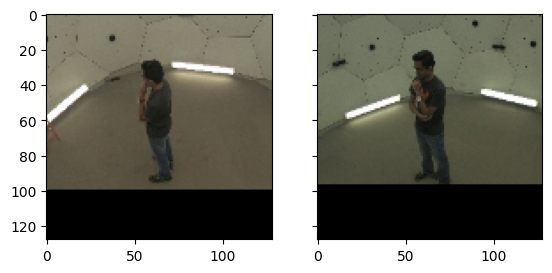

In [58]:
data, loader = get_dataset(443)
plot_item(data, 100)

# Siamese method

### As in [Siamese](https://arxiv.org/pdf/2011.10566.pdf), I replace the fully connected layer of the base encoder (ResNet50) with a projection and prediction heads. 

### Projection head consists of three layers. The first and second layers consist of linear layer (input and output dimentionality of both are 2048), batch normalization and relu activation function. The third layer consists only of linear layer with input and output dimentionality of 2048.

### Prediction head consists of two layers. It takes as an input the output of the projection head, projects it to the dimentionality of 512, followed by batch normalization and relu activation function. The second layer projects it back into 2048 dimentionality.


In [3]:
class SiamMLP(nn.Module):
    def __init__(self, input_dim, out_dim, hidder_proj, hidden_pred):
        super().__init__()
        
        self.projector = nn.Sequential(
            nn.Linear(input_dim, hidder_proj),
            nn.BatchNorm1d(hidder_proj),
            nn.ReLU(inplace=True),
            
            nn.Linear(hidder_proj, hidder_proj),
            nn.BatchNorm1d(hidder_proj),
            nn.ReLU(inplace=True),
            
            nn.Linear(hidder_proj, out_dim),
        )
        
        self.predictor = nn.Sequential(
            nn.Linear(out_dim, hidden_pred),
            nn.BatchNorm1d(hidden_pred),
            nn.ReLU(inplace=True),
            
            nn.Linear(hidden_pred, out_dim)
        )

        
    def forward(self, x):
        projections =  self.projector(x)
        predictions = self.predictor(projections)
        
        return x, projections, predictions

In [4]:
from torchvision.models import resnet50, ResNet50_Weights


def get_siam_net():
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights)
    model.fc = SiamMLP(2048, 2048, 2048, 512)
    
    return model

### As an optimizer I use stochastic gradient descent, since, on the contrary to SimCLR network, this methos does not require large batches. 

In [5]:
from torch.optim import SGD


def get_optimizer(model, lr, wd, momentum):
    final_layer_weights = []
    rest_of_the_net_weights = []

    for name, param in model.named_parameters():
        if name.startswith('fc'):
            final_layer_weights.append(param)
        else:
            rest_of_the_net_weights.append(param)
  
    optimizer = SGD([
        {'params': rest_of_the_net_weights},
        {'params': final_layer_weights, 'lr': lr}
    ], lr=lr / 2, weight_decay=wd, momentum=momentum)

    
    return optimizer

### Implementation of the following loss function. D - mean squared error of l2-normalized vectors, up to a scale of 2.

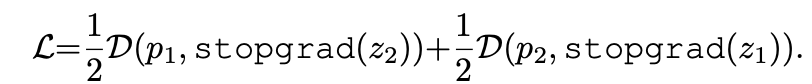

In [6]:
import torch.nn.functional as F


def get_loss(p1, z2, p2, z1):
    
    def D(p, z):
        z = z.detach()
        
        cos = nn.CosineSimilarity(dim=1)
        sim = cos(p, z)
        
        return sim.mean()
    
    loss = - (1/2 * D(p1, z2) + 1/2 * D(p2, z1))
    
    return loss


In [7]:
from tqdm import tqdm


def train_step(net, data_loader, optimizer, cost_function, device='cuda'):
    samples = 0.
    cumulative_loss = 0.
    net.train()
    
    for batch_idx, batch in enumerate(tqdm(data_loader)):
        
        image1 = batch['image1'].to(device)
        image2 = batch['image2'].to(device)

        x, z1, p1 = net(image1)
        x, z2, p2 = net(image2)

        loss = cost_function(p1, z2, p2, z1)
        loss.backward()

        optimizer.step()

        optimizer.zero_grad()
        
        cumulative_loss += loss.item()
        
        samples += image1.shape[0]
    
    return cumulative_loss / samples


In [8]:
def main(batch_size=200, device='cuda:0', learning_rate=0.01, weight_decay=0.000001, momentum=0.9, epochs=10):
    _, train_loader = get_dataset(batch_size)
    
    net = get_siam_net()
    net.to(device)
    
    optimizer = get_optimizer(net, lr=learning_rate, wd=weight_decay, momentum=momentum)
    
    cost_function = get_loss
    
    for e in range(epochs):
        train_loss = train_step(net, train_loader, optimizer, cost_function, device)
        
        print('Epoch: {:d}'.format(e+1))
        print('\tTraining loss {:.5f}'.format(train_loss))
    
    torch.save(net.state_dict(), 'siam.pt')
 

### The model was trained for 20 epochs with the batch size of 200.

In [359]:
main(batch_size=200, epochs=20)

# Clustering

The same as for SimCLR method, for clustering I use the dataset of 6000 images that contains different poses. I extract the representations from the trained model and run K means clustering algorithm (number of clusters=8) on these representation. I reduce the dimentionality of the representations with PCA algorithm and plot the clustering. Also for the comparison I use the representations extracted from encoder model and the representations extracted after the projection and prediction head.

In [9]:
class ClusterDataset(Dataset):
    def __init__(self, transform, data_set='training'):

        self.data_path = "/Users/olha/unitn/computer_vision/dataset/Panoptic/ProcessedPanopticDataset/171204_pose3/hdImages"

        images = [os.path.join(self.data_path, f) for f in os.listdir(self.data_path) if os.path.isfile(os.path.join(self.data_path, f))][0:6000]
        self.transform = transform

        self.data = {'paths': images}
    

    def __len__(self):
        return len(self.data['paths'])


    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        sample = dict()

        image_path = self.data['paths'][idx]
        
        image = cv2.imread(image_path)
        image =cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = self.transform(image)
        
        sample['image'] = image
        
        return sample

In [10]:
def get_cluster_data(batch_size):
    transforms = T.Compose(
        [
            T.ToTensor(),
            T.Resize(size=(128, 128)),
        ]
    )
    
    cluster_dataset = ClusterDataset(transforms)
    cluster_loader = torch.utils.data.DataLoader(cluster_dataset, batch_size)
    
    return cluster_dataset, cluster_loader

In [11]:
def extract_representations(path, cluster_loader, load=True):
    net = get_siam_net()
    
    if load:
        net.load_state_dict(torch.load(path, map_location=torch.device('cpu')))

    net.to('cpu')
    net.eval()
    
    base = []
    proj = []
    pred = []
        
    with torch.no_grad():
        for batch_idx, inputs in enumerate(cluster_loader):
            images = inputs['image']
            images.to('cpu')
            x, j, d = net(images)
            base.append(x)
            proj.append(j)
            pred.append(d)

    return torch.cat(base).numpy(), torch.cat(proj).numpy(), torch.cat(pred).numpy()

In [12]:
from sklearn.cluster import KMeans


def kmeans_algorithm(features, n_clusters=8):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(features)
    
    return kmeans.labels_

In [13]:
from sklearn.decomposition import PCA


def reduce_dim(features):
    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(features)
    
    return pca_features

In [14]:
def plot_clusters(clusters, pca_features, title):
    colors = {
        0: '#F8512E', 1: '#F8F82E',
        2: '#40F82E', 3: '#2EC1F8',
        4: '#6B2EF8', 5: '#D92EF8',
        6: '#731642', 7: '#092040'
    }
    
    cluster_colors = [colors[c] for c in clusters]
    
    plt.scatter(pca_features[:, 0], pca_features[:, 1], color=cluster_colors)
    plt.title(title)
    plt.show()

In [19]:
from sklearn.metrics import silhouette_score


def cluster(model_path, load=True):
    cluster_set, cluster_loader = get_cluster_data(30)
        
    base, proj, pred = extract_representations(model_path, cluster_loader, load)
    
    labels_base = kmeans_algorithm(base)
    pca_base = reduce_dim(base)
    
    labels_proj = kmeans_algorithm(proj)
    pca_proj = reduce_dim(proj)
    
    labels_pred = kmeans_algorithm(pred)
    pca_pred = reduce_dim(pred)
    
    silhouette_base = silhouette_score(base, labels_base)
    silhouette_proj = silhouette_score(proj, labels_proj)
    silhouette_pred = silhouette_score(pred, labels_pred)
    
    print("Silhouette score for the encoder features: {}".format(silhouette_base))
    print("Silhouette score for the projection head features: {}".format(silhouette_proj))
    print("Silhouette score for the prediction head features: {}".format(silhouette_pred))
    
    plot_clusters(labels_base, pca_base, "Encoder features")
    plot_clusters(labels_proj, pca_proj, "Projection head features")
    plot_clusters(labels_pred, pca_pred, "Prediction head features")
    
    return cluster_set, base, proj, pred, labels_base, labels_proj, labels_pred, pca_base, pca_proj, pca_pred

## After training

/Users/olha/unitn/NLU/myenv/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/Users/olha/unitn/NLU/myenv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/olha/unitn/

Silhouette score for the encoder features: 0.15307773649692535
Silhouette score for the projection head features: 0.21377067267894745
Silhouette score for the prediction head features: 0.32618093490600586


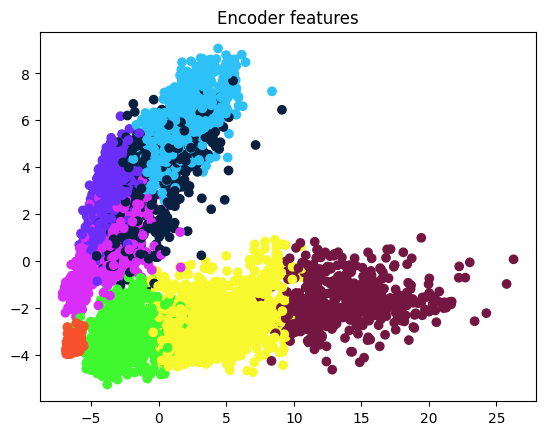

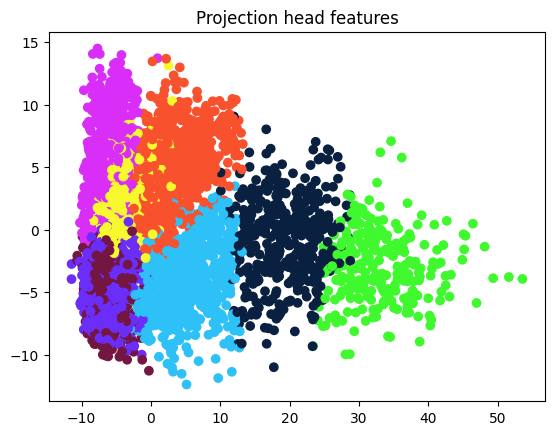

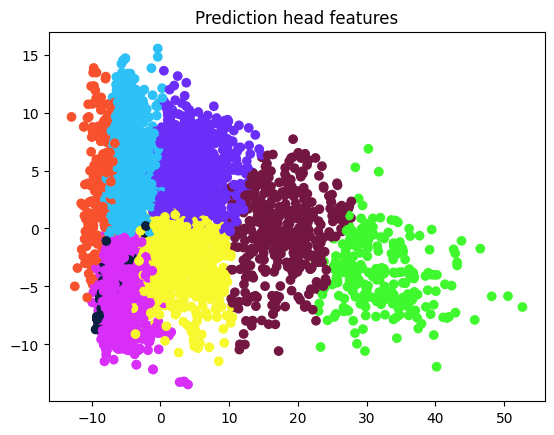

In [20]:
path = '../trained_models/siam.pt'

cluster_set, base, proj, pred, labels_base, labels_proj, labels_pred, pca_base, pca_proj, pca_pred = cluster(path)

## Before training

In [358]:
cluster(path, False)

## Clustering results

In [21]:
def plot_one_cluster(dataset, cluster_ind, labels):
    indexes = [i for i in range(0, len(labels)) if labels[i]==cluster_ind]

    plt.figure(figsize = (10,10))

    for i in range(0, 9):
        ax = plt.subplot(3, 3, i+1)
        ax.imshow(dataset[indexes[random.randint(0, len(indexes))]]['image'].permute(1, 2, 0))

    plt.show()

## Clustering based on features extracted from base encoder

/Users/olha/unitn/NLU/myenv/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


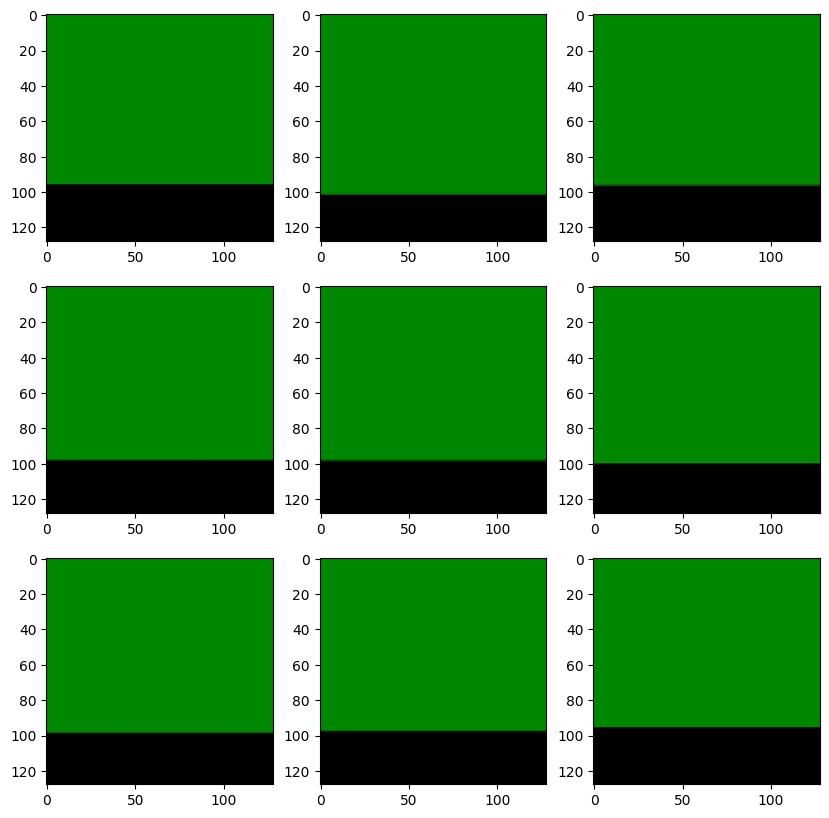

In [22]:
plot_one_cluster(cluster_set, 0, labels_base)

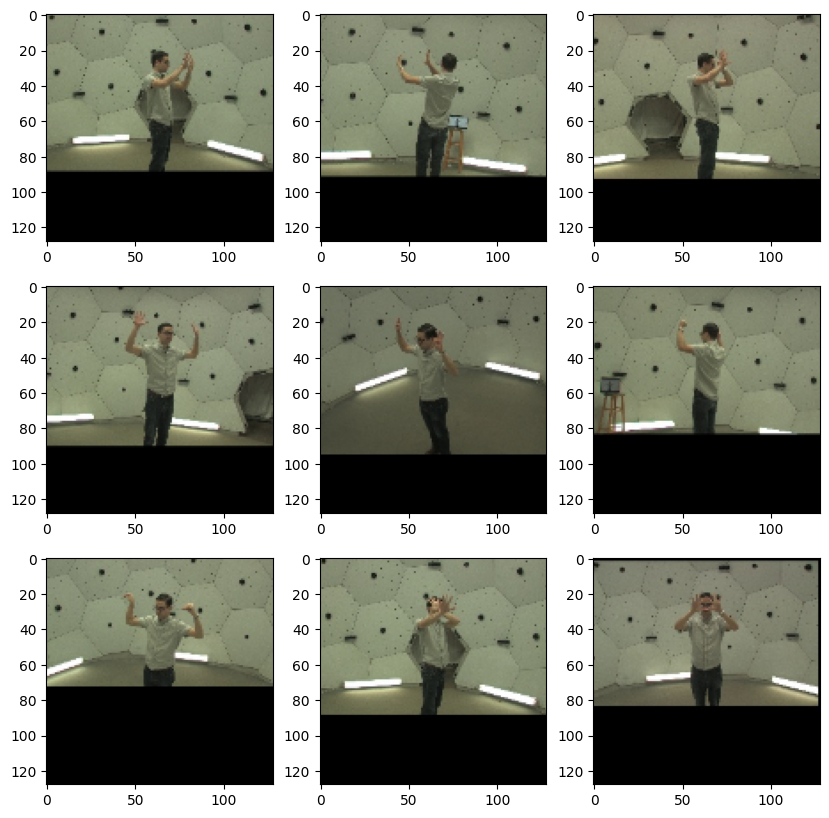

In [23]:
plot_one_cluster(cluster_set, 1, labels_base)

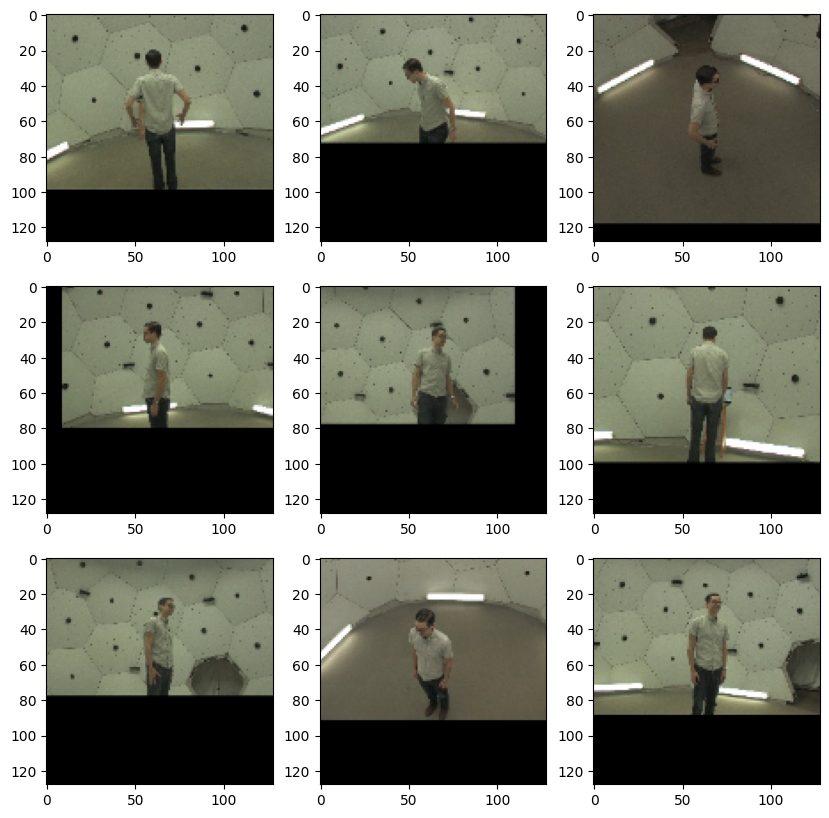

In [24]:
plot_one_cluster(cluster_set, 2, labels_base)

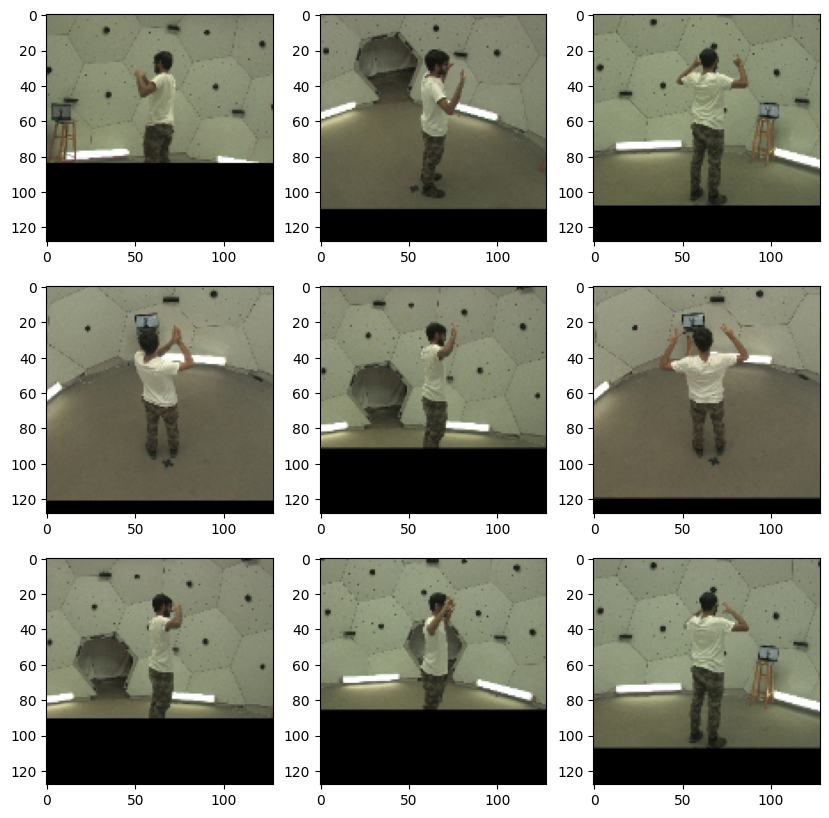

In [25]:
plot_one_cluster(cluster_set, 3, labels_base)

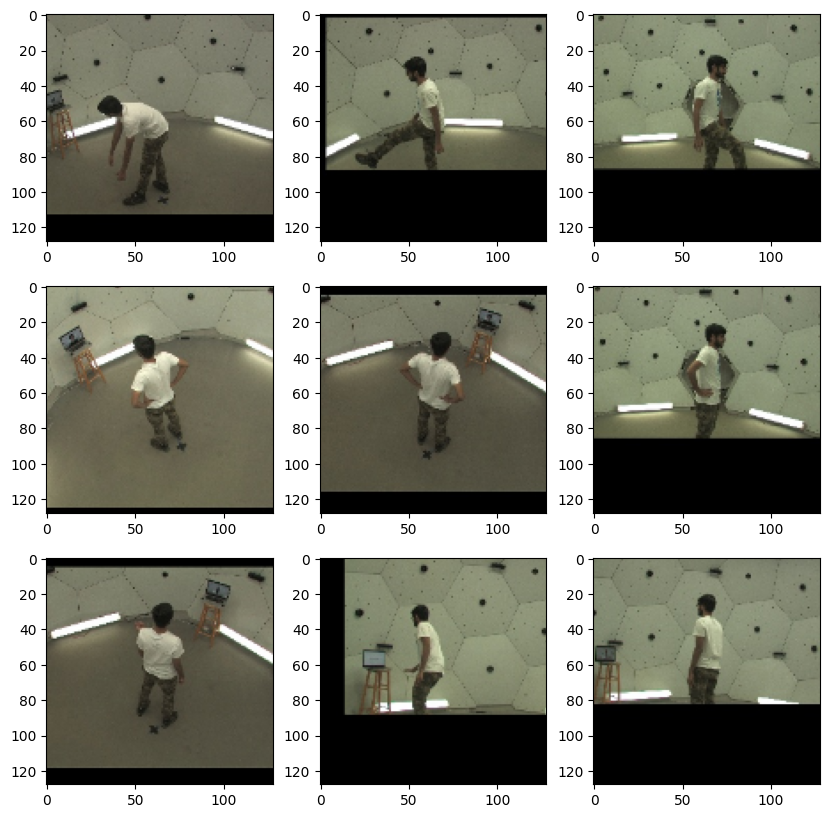

In [26]:
plot_one_cluster(cluster_set, 4, labels_base)

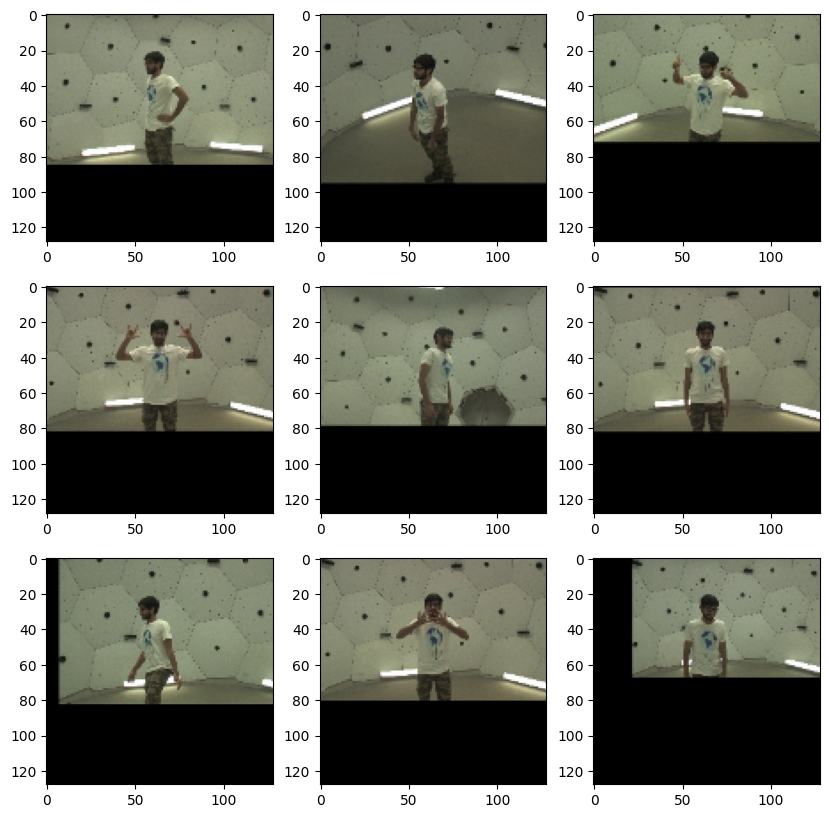

In [27]:
plot_one_cluster(cluster_set, 5, labels_base)

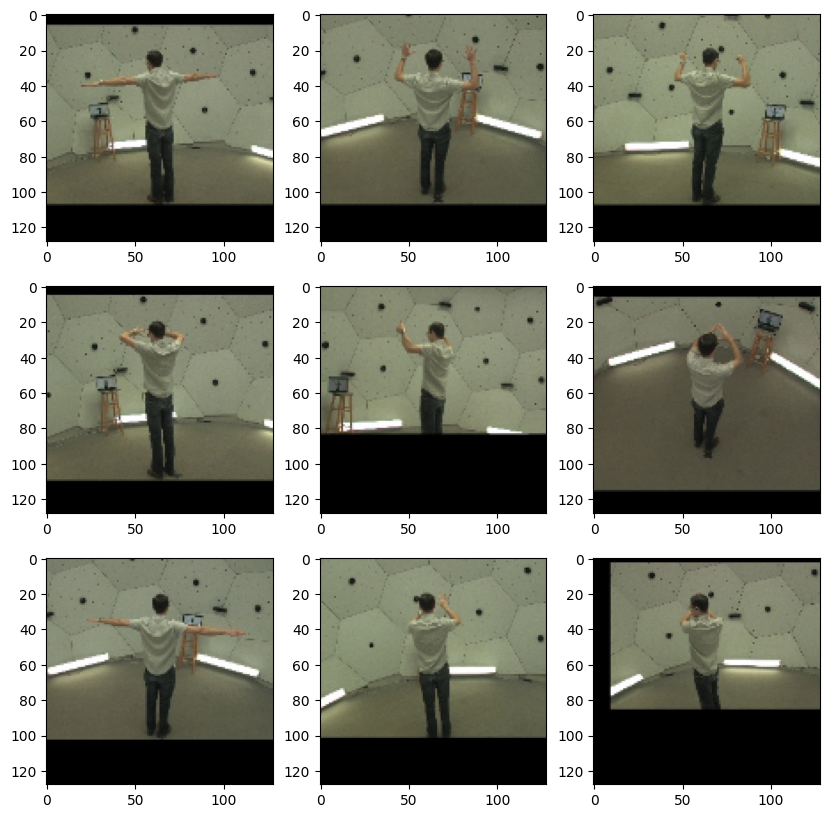

In [28]:
plot_one_cluster(cluster_set, 6, labels_base)

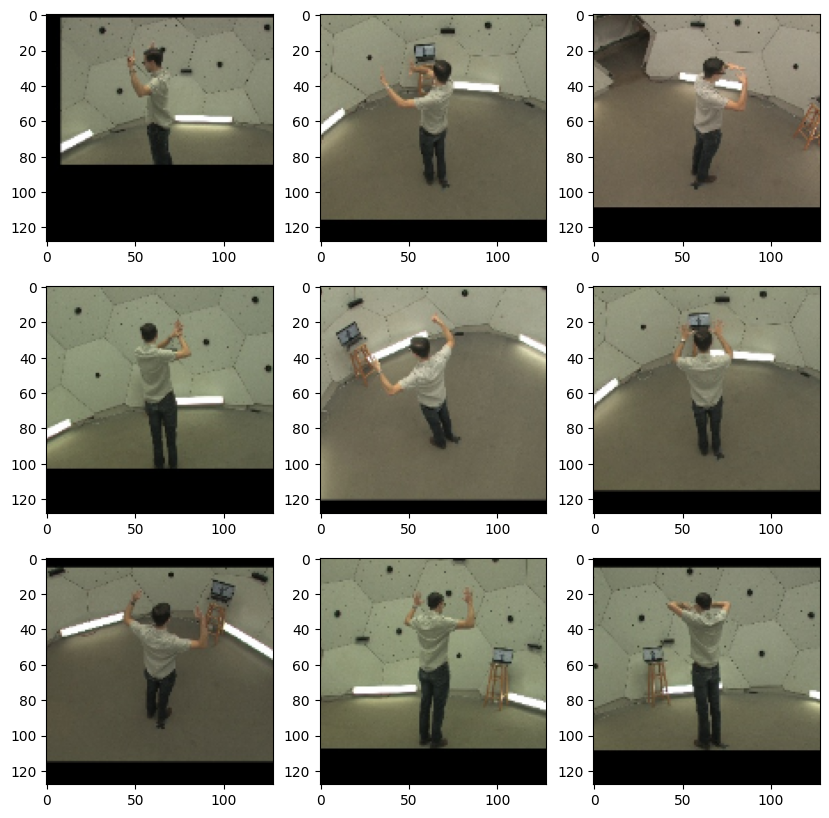

In [29]:
plot_one_cluster(cluster_set, 6, labels_base)

## Clustering based on features extracted from projection head

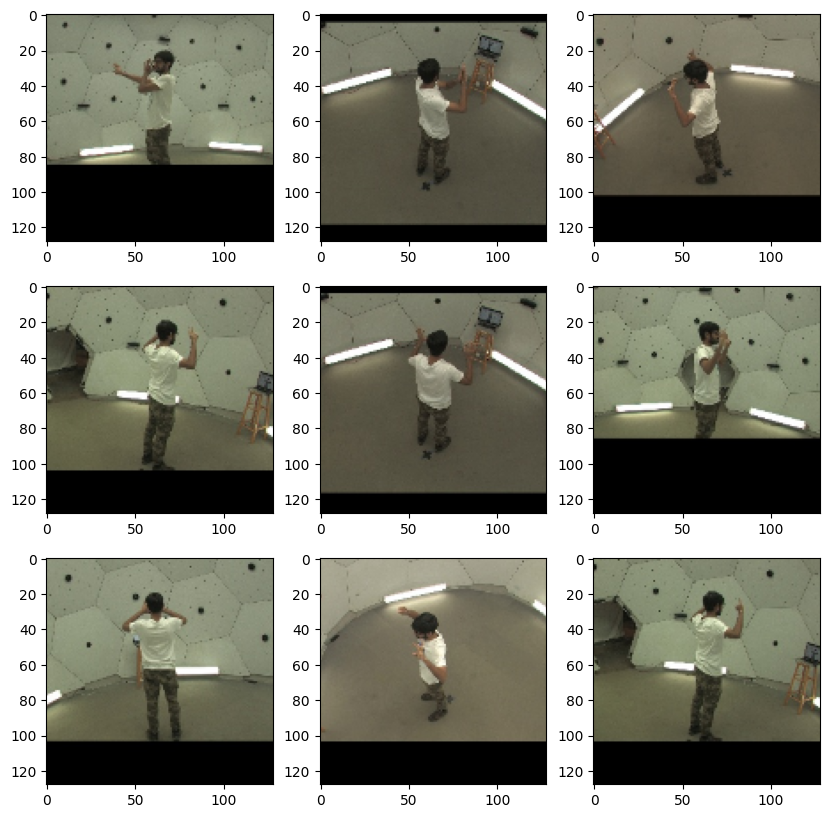

In [30]:
plot_one_cluster(cluster_set, 0, labels_proj)

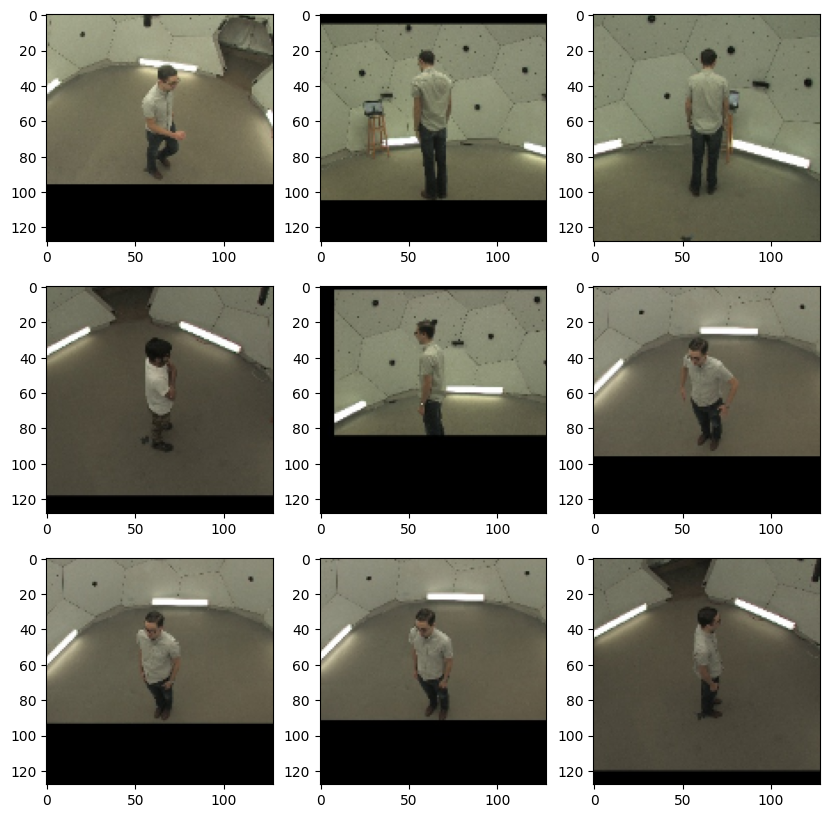

In [31]:
plot_one_cluster(cluster_set, 1, labels_proj)

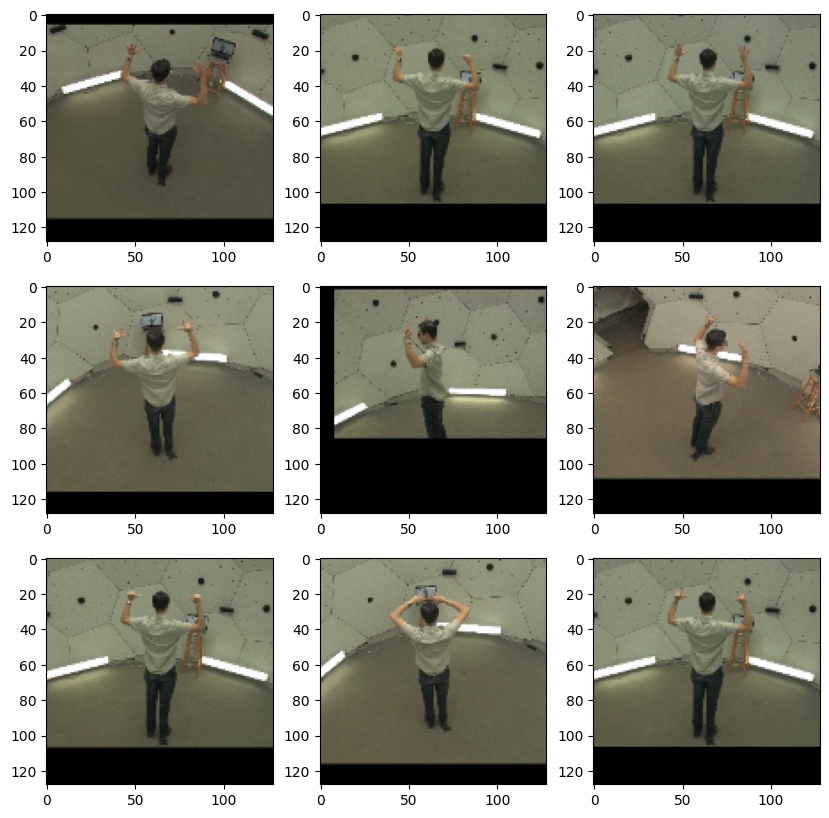

In [32]:
plot_one_cluster(cluster_set, 2, labels_proj)

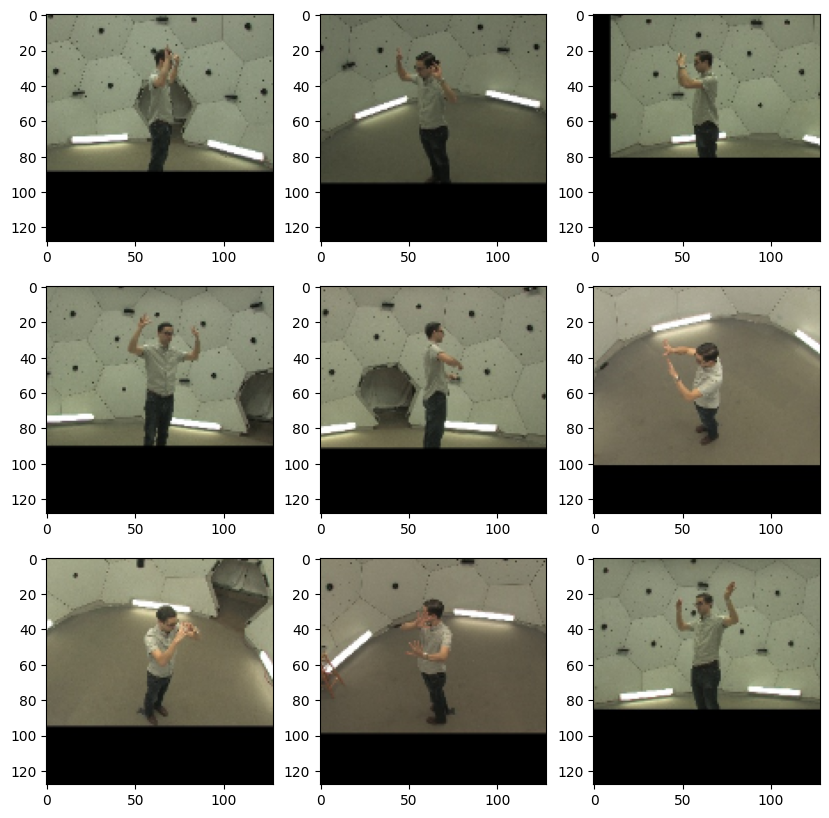

In [33]:
plot_one_cluster(cluster_set, 3, labels_proj)

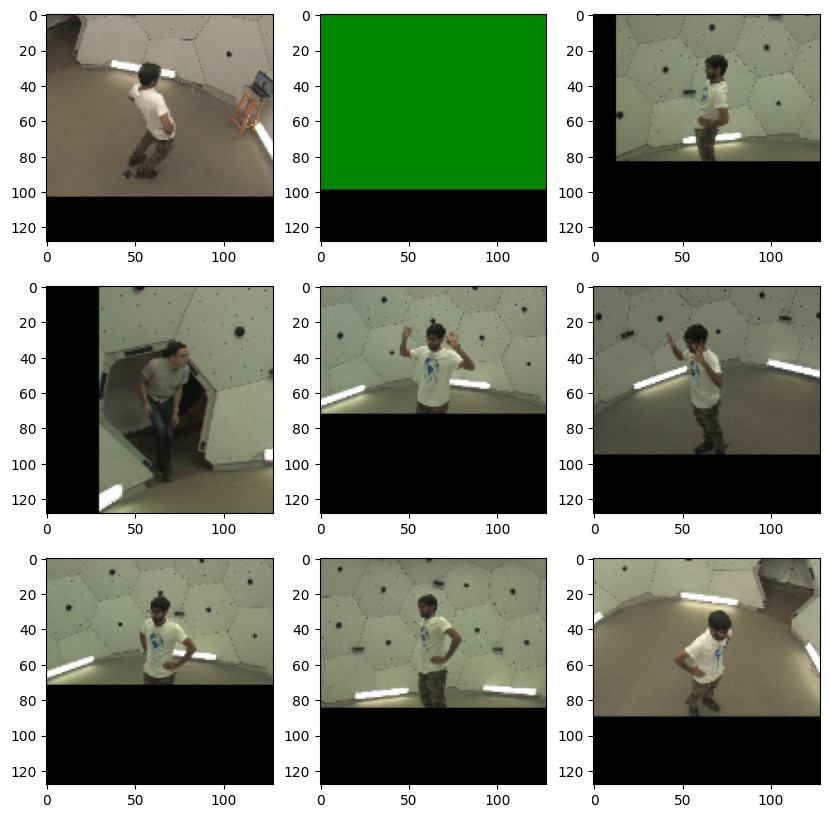

In [34]:
plot_one_cluster(cluster_set, 4, labels_proj)

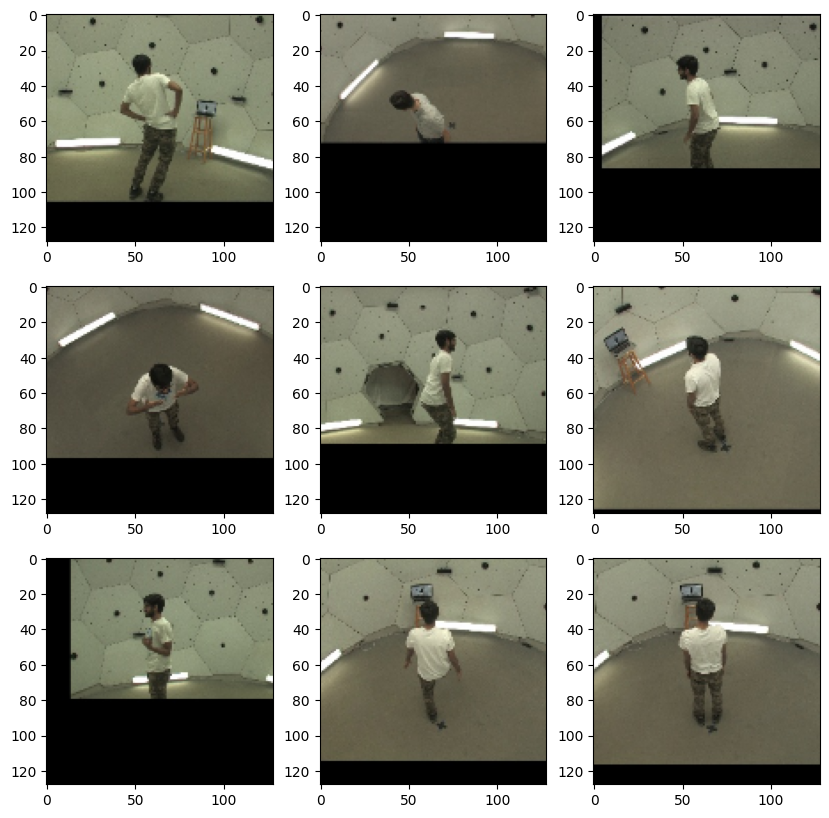

In [35]:
plot_one_cluster(cluster_set, 5, labels_proj)

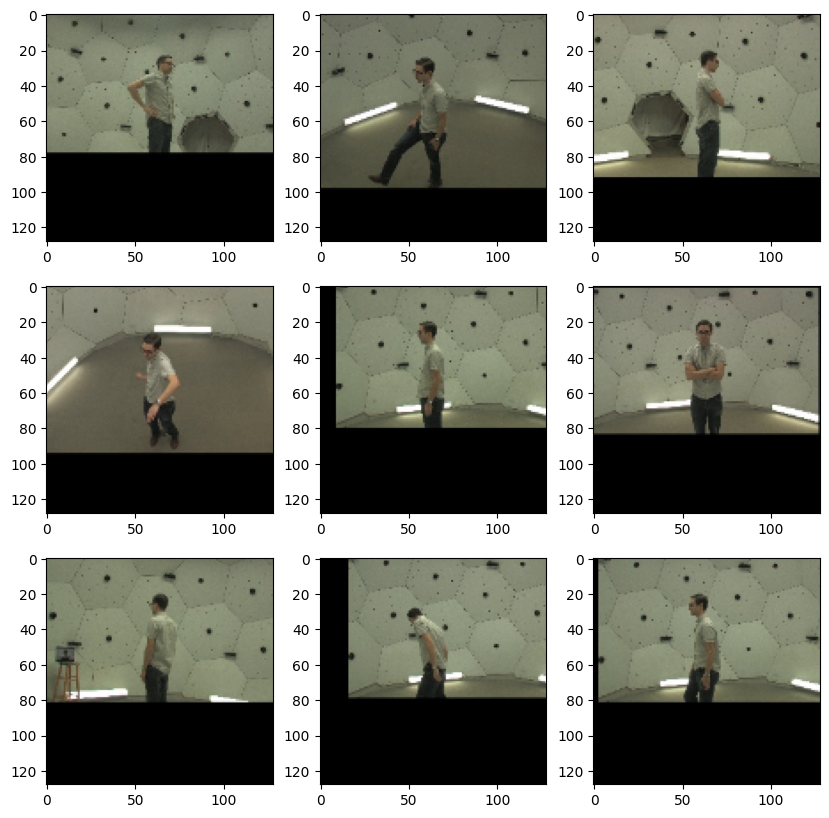

In [36]:
plot_one_cluster(cluster_set, 6, labels_proj)

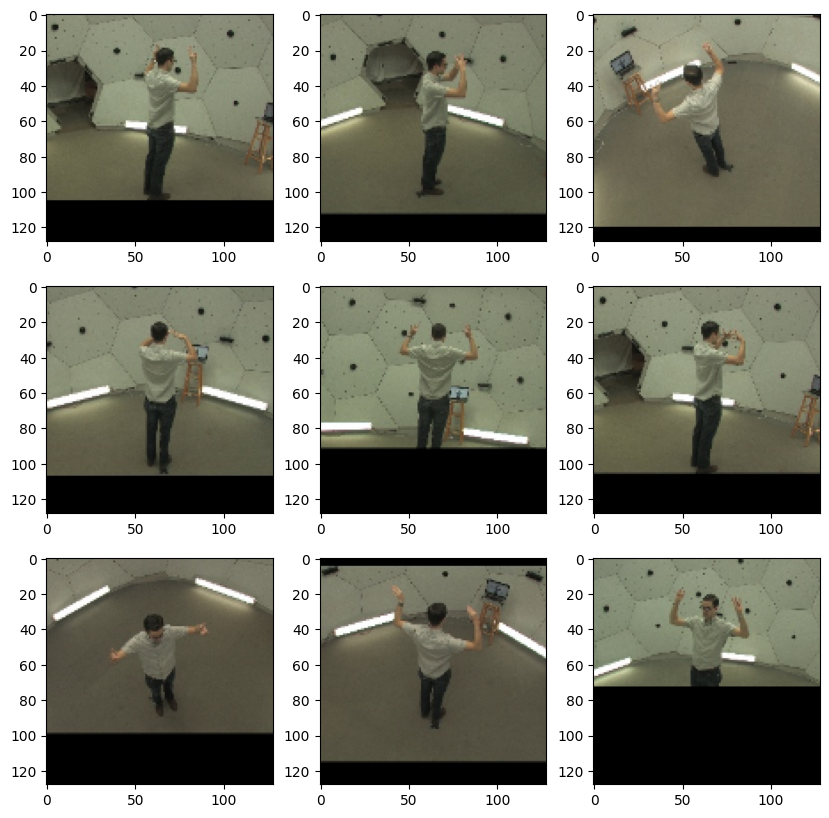

In [37]:
plot_one_cluster(cluster_set, 7, labels_proj)

## Clustering based on features extracted from prediction head

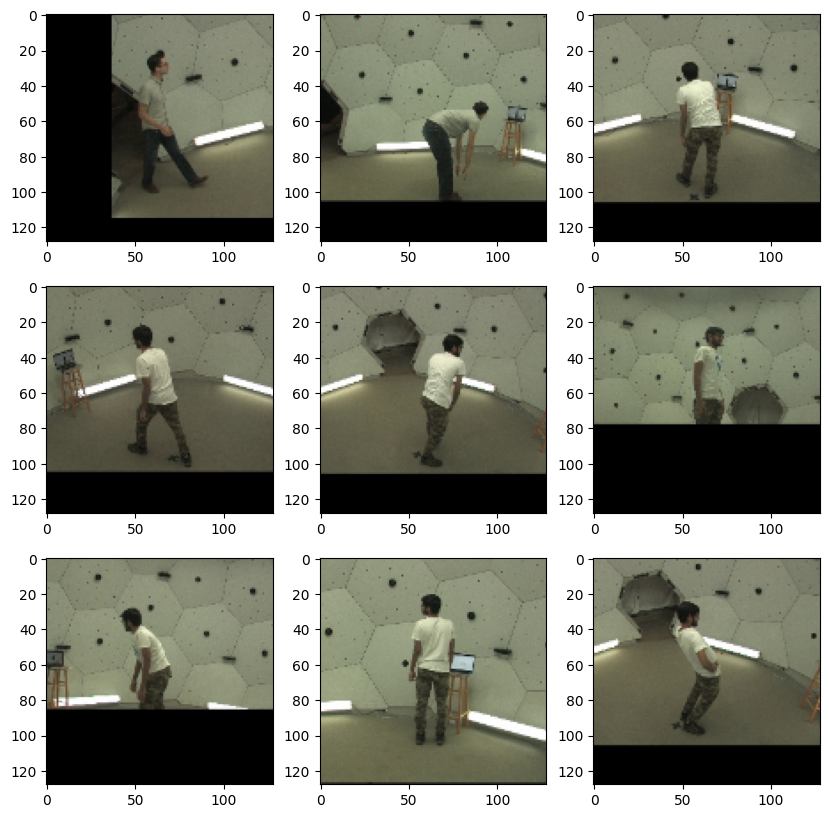

In [38]:
plot_one_cluster(cluster_set, 0, labels_pred)

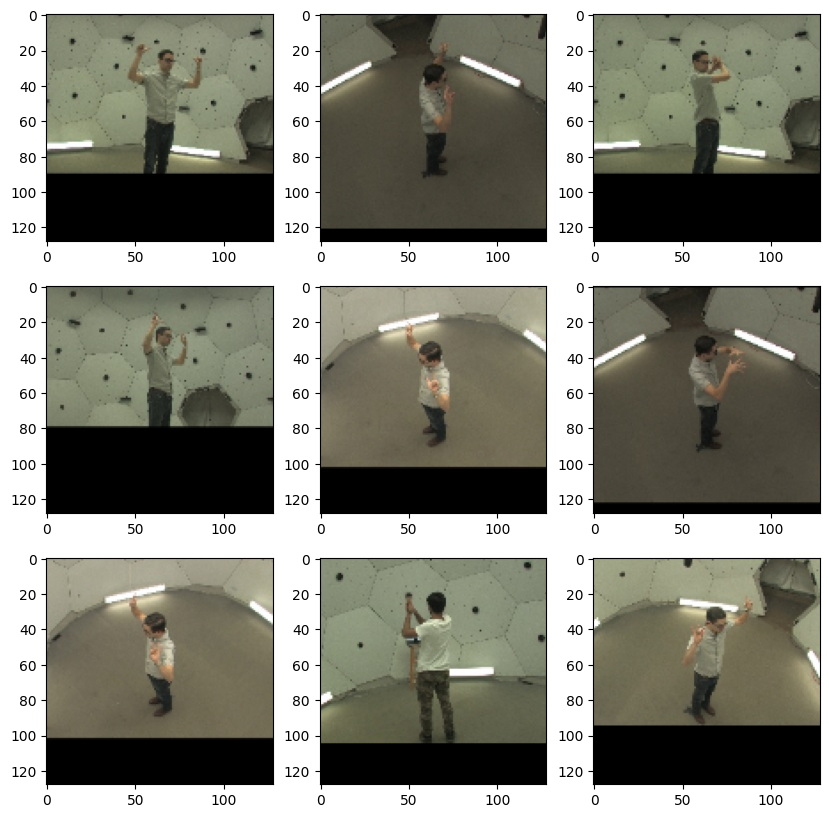

In [39]:
plot_one_cluster(cluster_set, 1, labels_pred)

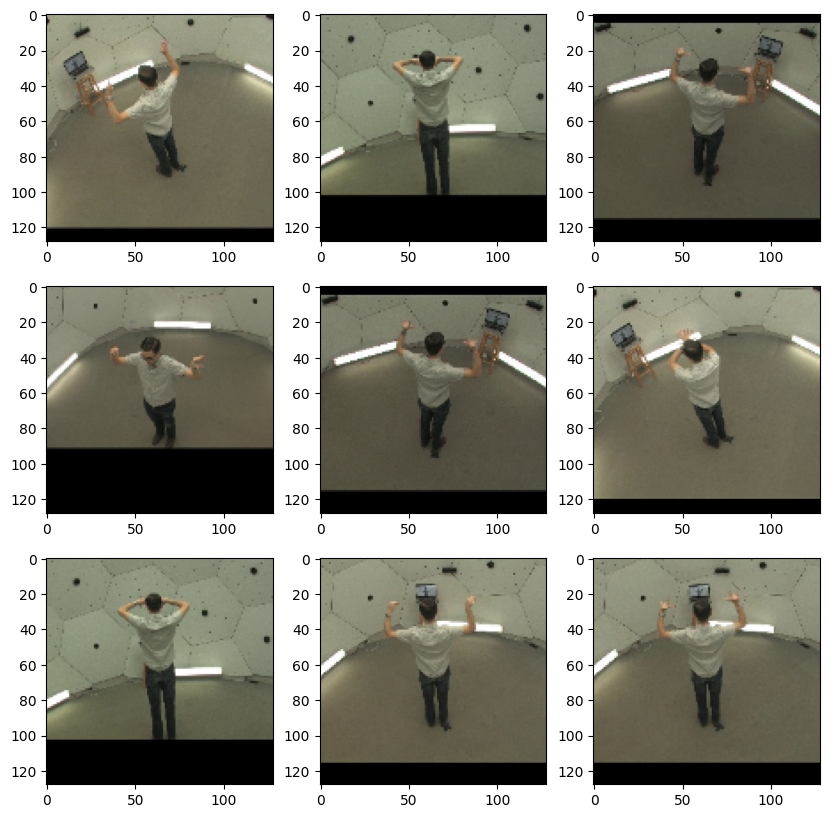

In [40]:
plot_one_cluster(cluster_set, 2, labels_pred)

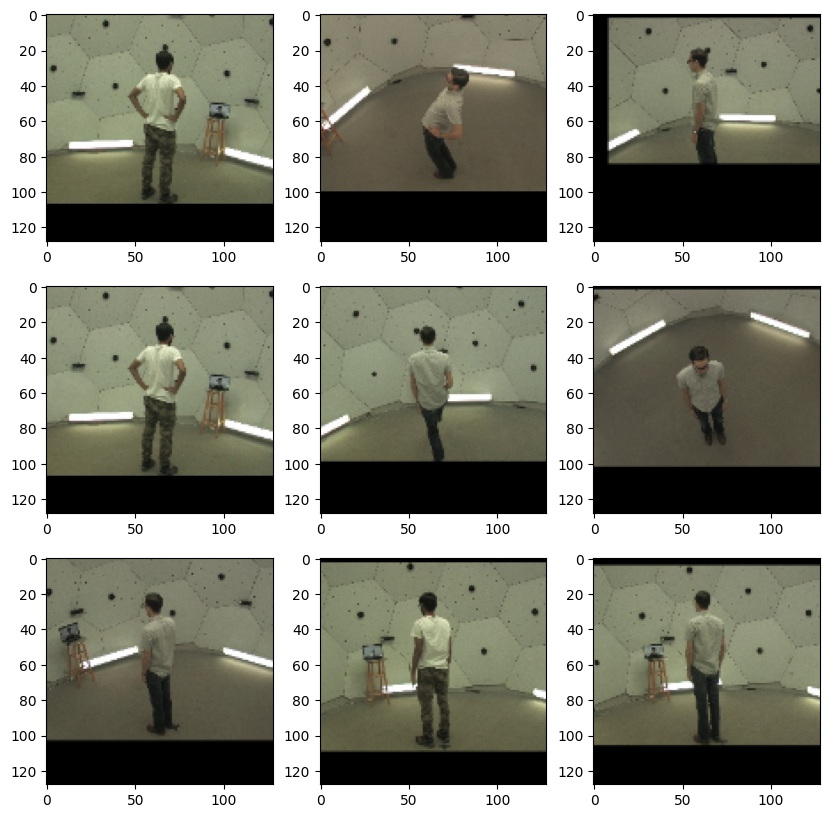

In [41]:
plot_one_cluster(cluster_set, 3, labels_pred)

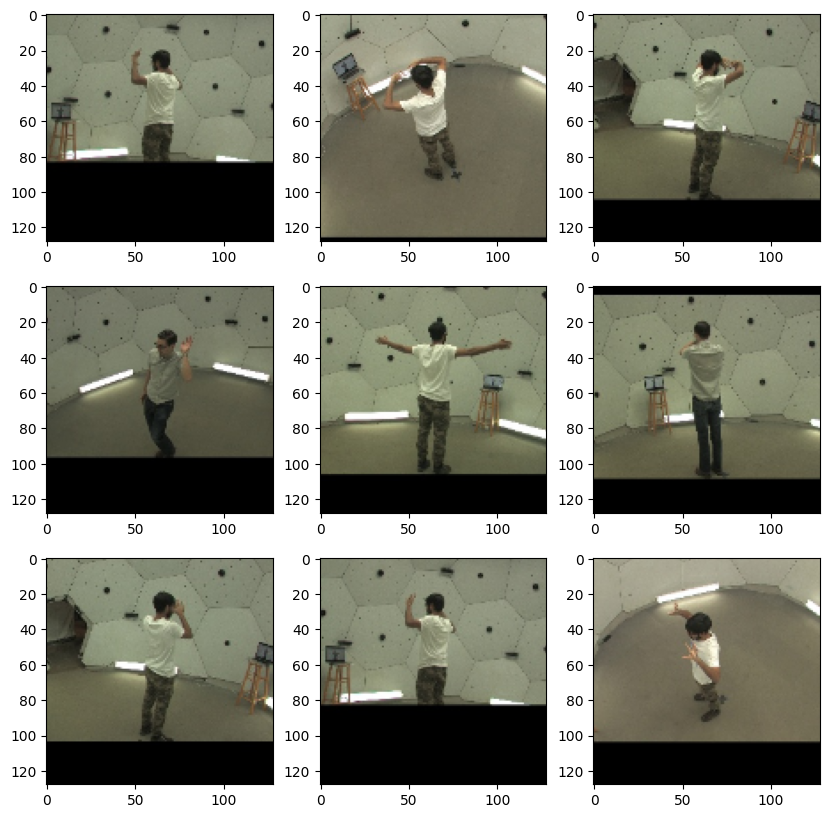

In [42]:
plot_one_cluster(cluster_set, 4, labels_pred)

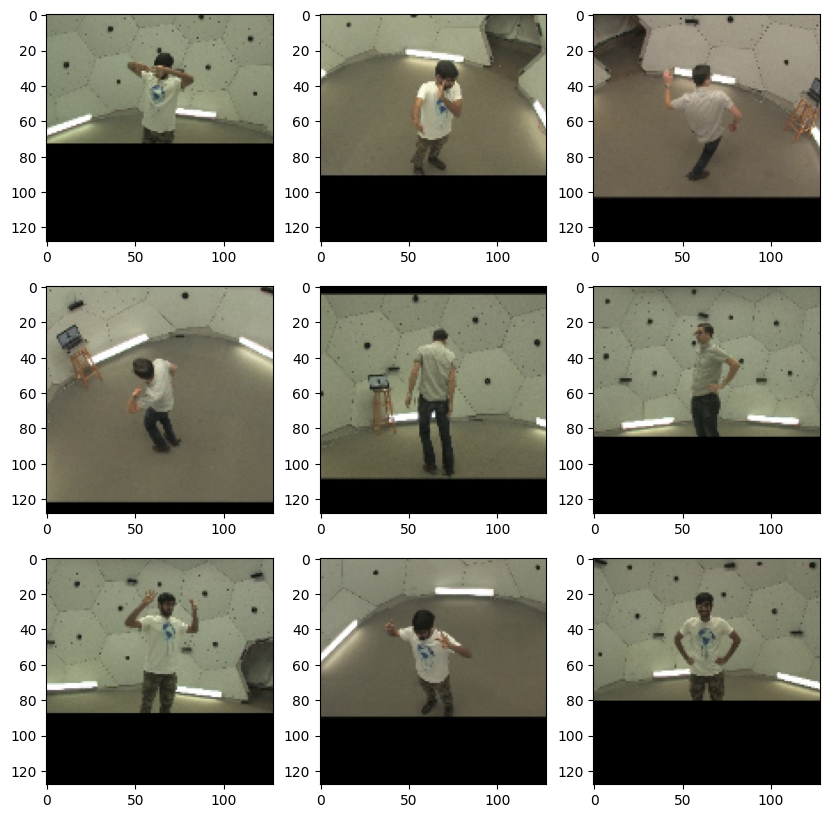

In [43]:
plot_one_cluster(cluster_set, 5, labels_pred)

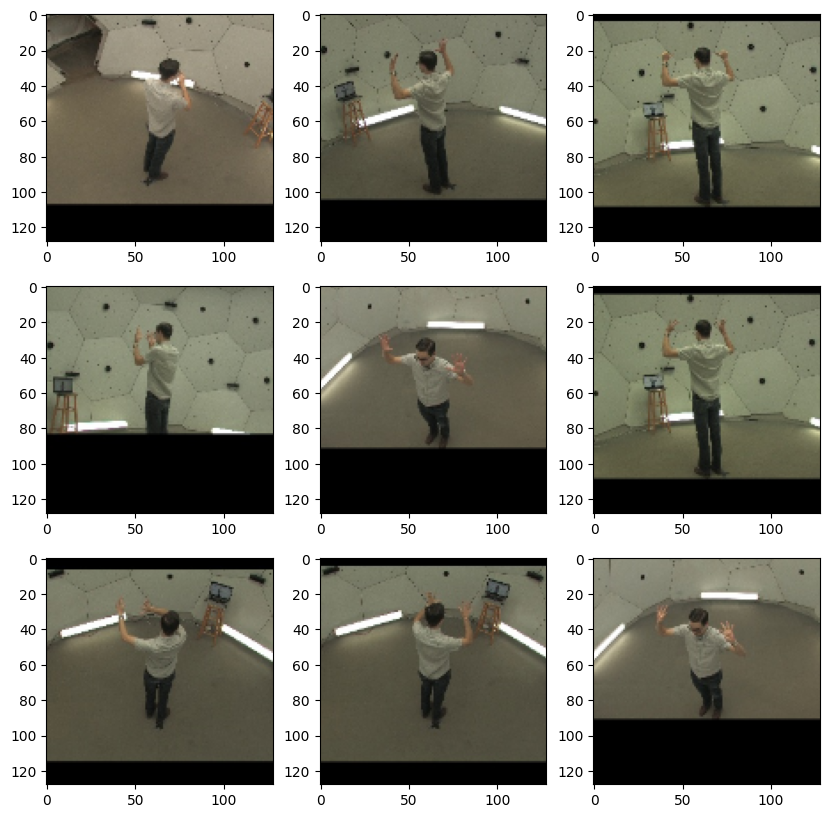

In [44]:
plot_one_cluster(cluster_set, 6, labels_pred)

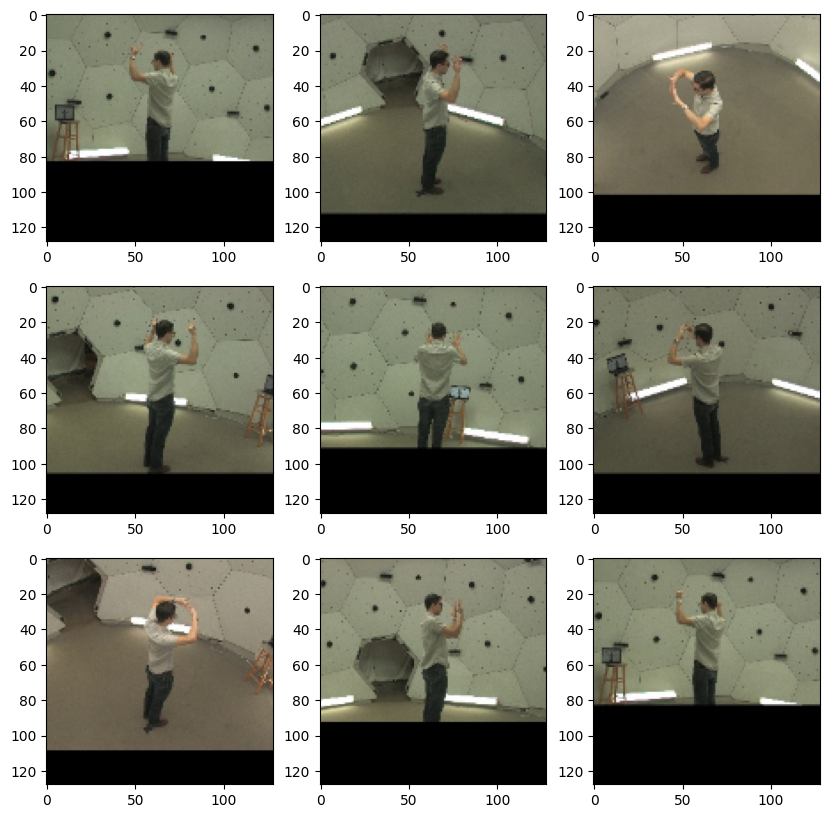

In [45]:
plot_one_cluster(cluster_set, 6, labels_pred)